# Technical Analysis
## This tool is used to analyse the financial market with different indicators and finfing the inverse head and shoulder formation with different parameters.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
!pip install cufflinks
!pip install yfinance
!pip install pandas_datareader
!pip install scipy.signal
!pip install collections
from collections import defaultdict
from scipy.signal import argrelextrema
import cufflinks as cf
from pandas_datareader import data
import requests
import sys
import yfinance as yf

ERROR: Could not find a version that satisfies the requirement scipy.signal (from versions: none)
ERROR: No matching distribution found for scipy.signal
ERROR: Could not find a version that satisfies the requirement collections (from versions: none)
ERROR: No matching distribution found for collections


In [2]:
start = "2010-01-01"
end = "2020-12-31"

In [3]:
symbol = ["MSFT", "IVV"]

In [4]:
df = yf.download(tickers=symbol, start=start, end=end)
df.head()

[*********************100%***********************]  2 of 2 completed


Adj Close                  Close                   High  \
                  IVV       MSFT         IVV       MSFT         IVV   
Date                                                                  
2010-01-04  88.780983  23.683069  113.650002  30.950001  113.739998   
2010-01-05  89.038773  23.690725  113.980003  30.959999  114.029999   
2010-01-06  89.109047  23.545328  114.070000  30.770000  114.339996   
2010-01-07  89.499649  23.300465  114.570000  30.450001  114.669998   
2010-01-08  89.804321  23.461159  114.959999  30.660000  114.970001   

                              Low                   Open              Volume  \
                 MSFT         IVV       MSFT         IVV       MSFT      IVV   
Date                                                                           
2010-01-04  31.100000  112.709999  30.590000  112.769997  30.620001  3574200   
2010-01-05  31.100000  113.250000  30.639999  113.620003  30.850000  2784100   
2010-01-06  31.080000  113.790001  30.520000  113.889999  30.879999  3912800   
2010-01-07  30.700001  113.550003  30.190001  113.870003  30.629999  2977600   
2010-01-08  30.879999  114.010002  30.240000  114.230003  30.280001  2887600   

                      
                MSFT  
Date                  
2010-01-04  38409100  
2010-01-05  49749600  
2010-01-06  58182400  
2010-01-07  50559700  
2010-01-08  51197400

In [5]:
df.to_csv("stocks.csv")

In [6]:
df = pd.read_csv("stocks.csv", header = [0, 1], index_col = 0, parse_dates = [0])
df.head()

Adj Close                  Close                   High  \
                  IVV       MSFT         IVV       MSFT         IVV   
Date                                                                  
2010-01-04  88.780983  23.683069  113.650002  30.950001  113.739998   
2010-01-05  89.038773  23.690725  113.980003  30.959999  114.029999   
2010-01-06  89.109047  23.545328  114.070000  30.770000  114.339996   
2010-01-07  89.499649  23.300465  114.570000  30.450001  114.669998   
2010-01-08  89.804321  23.461159  114.959999  30.660000  114.970001   

                              Low                   Open              Volume  \
                 MSFT         IVV       MSFT         IVV       MSFT      IVV   
Date                                                                           
2010-01-04  31.100000  112.709999  30.590000  112.769997  30.620001  3574200   
2010-01-05  31.100000  113.250000  30.639999  113.620003  30.850000  2784100   
2010-01-06  31.080000  113.790001  30.520000  113.889999  30.879999  3912800   
2010-01-07  30.700001  113.550003  30.190001  113.870003  30.629999  2977600   
2010-01-08  30.879999  114.010002  30.240000  114.230003  30.280001  2887600   

                      
                MSFT  
Date                  
2010-01-04  38409100  
2010-01-05  49749600  
2010-01-06  58182400  
2010-01-07  50559700  
2010-01-08  51197400

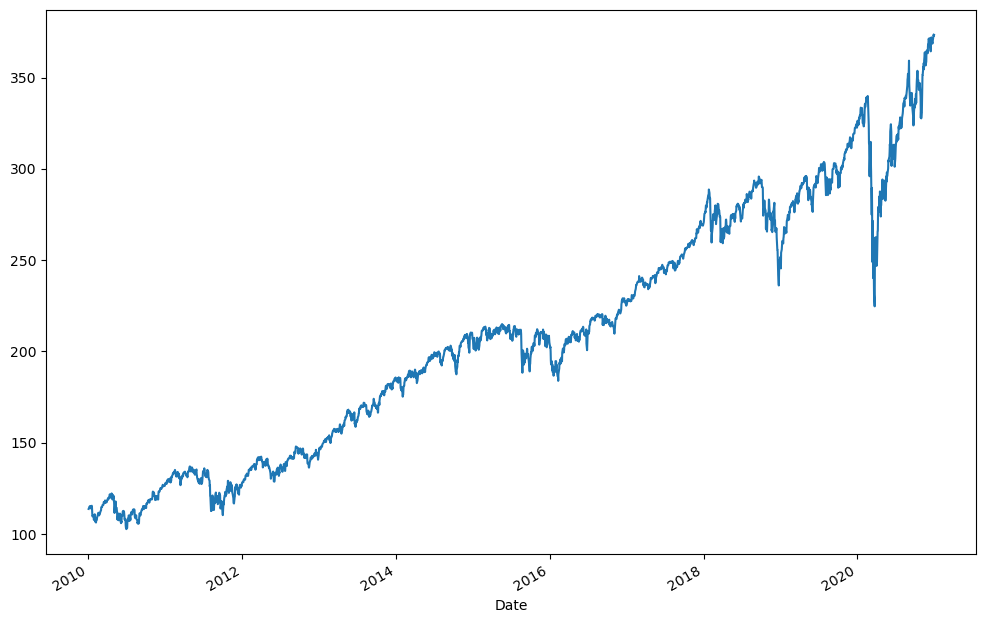

In [7]:
df.Close.IVV.plot(figsize = (12, 8))
plt.show()

<AxesSubplot:xlabel='Date'>

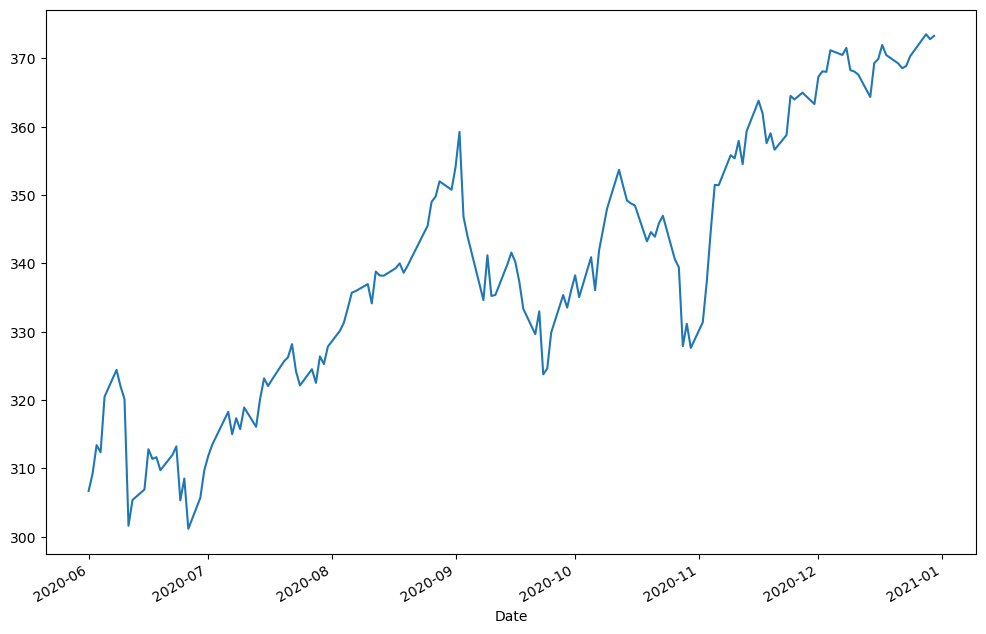

In [8]:
df.loc["2020-06":, ("Close", "IVV")].plot(figsize = (12, 8))

# INTERACTIVE PLOTS

In [9]:
cf.set_config_file(offline = True)

In [10]:
df.loc["2020-06":, ("Close", "IVV")].iplot()

In [11]:
df.Close.iplot()

# Customize charts

In [12]:
df.Close.iplot(fill = True)

In [13]:
cf.colors.scales()

In [14]:
df.Close.iplot(fill = True, colorscale = "reds")

In [15]:
cf.getThemes()

['ggplot', 'pearl', 'solar', 'space', 'white', 'polar', 'henanigans']

In [16]:
df.Close.iplot(fill = True, colorscale = "reds", theme = "solar")

In [17]:
df.Close.iplot(fill = True, colorscale = "reds", title = "Stocks title", xTitle = "time", yTitle = "Closing price")

In [18]:
df.Close.iplot(kind = "spread", fill = True, colorscale = "reds", title = "Stocks title", xTitle = "time", yTitle = "Closing price")

C:\Users\admin\anaconda3\lib\site-packages\cufflinks\plotlytools.py:850: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead.



# Candlestick charts 

In [19]:
df.swaplevel(axis = 1)

,IVV,MSFT,IVV,MSFT,IVV,MSFT,IVV,MSFT,IVV,MSFT,IVV,MSFT
,Adj Close,Adj Close,Close,Close,High,High,Low,Low,Open,Open,Volume,Volume
Date,,,,,,,,,,,,
2010-01-04,88.780983,23.683069,113.650002,30.950001,113.739998,31.100000,112.709999,30.590000,112.769997,30.620001,3574200,38409100
2010-01-05,89.038773,23.690725,113.980003,30.959999,114.029999,31.100000,113.250000,30.639999,113.620003,30.850000,2784100,49749600
2010-01-06,89.109047,23.545328,114.070000,30.770000,114.339996,31.080000,113.790001,30.520000,113.889999,30.879999,3912800,58182400
2010-01-07,89.499649,23.300465,114.570000,30.450001,114.669998,30.700001,113.550003,30.190001,113.870003,30.629999,2977600,50559700
2010-01-08,89.804321,23.461159,114.959999,30.660000,114.970001,30.879999,114.010002,30.240000,114.230003,30.280001,2887600,51197400
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-23,358.292389,217.148026,368.880005,221.020004,370.959991,223.559998,368.700012,220.800003,369.630005,223.110001,3234300,18699600
2020-12-24,359.681335,218.847717,370.309998,222.750000,370.359985,223.610001,368.809998,221.199997,369.420013,221.419998,2040700,10550600


In [20]:
ivv = df.swaplevel(axis = 1).IVV.copy()

In [21]:
ivv

,Adj Close,Close,High,Low,Open,Volume
Date,,,,,,
2010-01-04,88.780983,113.650002,113.739998,112.709999,112.769997,3574200
2010-01-05,89.038773,113.980003,114.029999,113.250000,113.620003,2784100
2010-01-06,89.109047,114.070000,114.339996,113.790001,113.889999,3912800
2010-01-07,89.499649,114.570000,114.669998,113.550003,113.870003,2977600
2010-01-08,89.804321,114.959999,114.970001,114.010002,114.230003,2887600
...,...,...,...,...,...,...
2020-12-23,358.292389,368.880005,370.959991,368.700012,369.630005,3234300
2020-12-24,359.681335,370.309998,370.359985,368.809998,369.420013,2040700
2020-12-28,362.808899,373.529999,373.940002,372.440002,373.149994,2342800


In [22]:
ivv.loc["5-2017"].iplot(kind = "candle")

# Weekly transform

In [23]:
from pandas.tseries.frequencies import to_offset

In [24]:
weekly = ivv.resample("W-Fri").ohlc()

In [25]:
weekly

Adj Close                                           Close  \
                  open        high         low       close        open   
Date                                                                     
2010-01-08   88.780983   89.804321   88.780983   89.804321  113.650002   
2010-01-15   89.929306   90.069939   89.054367   89.054367  115.120003   
2010-01-22   90.155861   90.155861   85.625015   85.625015  115.410004   
2010-01-29   86.054672   86.085899   84.101723   84.101723  110.160004   
2010-02-05   85.429718   86.499916   83.429886   83.609566  109.360001   
...                ...         ...         ...         ...         ...   
2020-12-04  351.346497  358.957062  351.346497  358.957062  363.320007   
2020-12-11  358.289825  359.285889  355.504730  355.504730  370.500000   
2020-12-18  353.892426  361.283966  353.892426  359.856201  364.350006   
2020-12-25  358.671173  359.681335  357.981537  359.681335  369.269989   
2021-01-01  362.808899  362.808899  362.109589  362.585480  373.529999   

                                                      High              ...  \
                  high         low       close        open        high  ...   
Date                                                                    ...   
2010-01-08  114.959999  113.650002  114.959999  113.739998  114.970001  ...   
2010-01-15  115.300003  114.000000  114.000000  115.489998  115.489998  ...   
2010-01-22  115.410004  109.610001  109.610001  115.489998  115.489998  ...   
2010-01-29  110.199997  107.660004  107.660004  110.760002  110.809998  ...   
2010-02-05  110.730003  106.800003  107.029999  109.400002  110.940002  ...   
...                ...         ...         ...         ...         ...  ...   
2020-12-04  371.190002  363.320007  371.190002  364.390015  371.200012  ...   
2020-12-11  371.529999  367.619995  367.619995  370.989990  372.420013  ...   
2020-12-18  371.959991  364.350006  370.489990  369.570007  372.480011  ...   
2020-12-25  370.309998  368.559998  370.309998  370.140015  370.959991  ...   
2021-01-01  373.529999  372.809998  373.299988  373.940002  375.399994  ...   

                   Low                    Open                          \
                   low       close        open        high         low   
Date                                                                     
2010-01-08  112.709999  114.010002  112.769997  114.230003  112.769997   
2010-01-15  113.559998  113.559998  115.400002  115.400002  114.320000   
2010-01-22  109.459999  109.459999  114.000000  114.629997  111.580002   
2010-01-29  107.559998  107.559998  110.570000  110.570000  109.379997   
2010-02-05  104.900002  104.900002  108.550003  110.239998  106.910004   
...                ...         ...         ...         ...         ...   
2020-12-04  360.500000  368.619995  364.179993  368.679993  364.179993   
2020-12-11  364.619995  364.619995  370.429993  372.279999  366.269989   
2020-12-18  364.209991  368.359985  368.440002  372.359985  367.140015   
2020-12-25  363.380005  368.809998  366.299988  369.630005  366.299988   
2021-01-01  372.200012  372.950012  373.149994  375.149994  373.149994   

                         Volume                             
                 close     open     high      low    close  
Date                                                        
2010-01-08  114.230003  3574200  3912800  2784100  2887600  
2010-01-15  114.989998  3100500  5227700  2608000  5227700  
2010-01-22  111.580002  3430200  9015900  3430200  7485100  
2010-01-29  109.379997  3414600  5678400  3414600  5678400  
2010-02-05  106.910004  3406900  7381300  3188400  7381300  
...                ...      ...      ...      ...      ...  
2020-12-04  368.679993  4093400  4121900  3068500  4091800  
2020-12-11  366.269989  3162300  4501600  3151100  4501600  
2020-12-18  372.359985  3797600  8472400  3797600  6697600  
2020-12-25  369.420013  5221600  5221600  2040700  2040700  
2021-01-01  373.739990  2342800  540160

# Aggregating

In [26]:
weekly = ivv.resample("W-Fri").agg({
    "Open": "first",
    "High": "max",
    "Low": "min",
    "Close": "last"
})

In [27]:
weekly

,Open,High,Low,Close
Date,,,,
2010-01-08,112.769997,114.970001,112.709999,114.959999
2010-01-15,115.400002,115.489998,113.559998,114.000000
2010-01-22,114.000000,115.489998,109.459999,109.610001
2010-01-29,110.570000,110.809998,107.559998,107.660004
2010-02-05,108.550003,110.940002,104.900002,107.029999
...,...,...,...,...
2020-12-04,364.179993,371.200012,360.500000,371.190002
2020-12-11,370.429993,372.420013,364.619995,367.619995
2020-12-18,368.440002,372.480011,364.209991,370.489990


In [28]:
weekly.index = weekly.index - to_offset("4d")

In [29]:
weekly

,Open,High,Low,Close
Date,,,,
2010-01-04,112.769997,114.970001,112.709999,114.959999
2010-01-11,115.400002,115.489998,113.559998,114.000000
2010-01-18,114.000000,115.489998,109.459999,109.610001
2010-01-25,110.570000,110.809998,107.559998,107.660004
2010-02-01,108.550003,110.940002,104.900002,107.029999
...,...,...,...,...
2020-11-30,364.179993,371.200012,360.500000,371.190002
2020-12-07,370.429993,372.420013,364.619995,367.619995
2020-12-14,368.440002,372.480011,364.209991,370.489990


In [30]:
weekly.loc["5-2017":"9-2017"].iplot(kind = "candle")

# Volume

In [31]:
q_ivv = cf.QuantFig(df = ivv.loc["5-2017"])

In [32]:
type(q_ivv)

cufflinks.quant_figure.QuantFig

In [33]:
q_ivv.iplot(title = "Volume IVV")

In [34]:
q_ivv.add_volume(colorchange = False)

# Technical indicators

In [35]:
ivv

,Adj Close,Close,High,Low,Open,Volume
Date,,,,,,
2010-01-04,88.780983,113.650002,113.739998,112.709999,112.769997,3574200
2010-01-05,89.038773,113.980003,114.029999,113.250000,113.620003,2784100
2010-01-06,89.109047,114.070000,114.339996,113.790001,113.889999,3912800
2010-01-07,89.499649,114.570000,114.669998,113.550003,113.870003,2977600
2010-01-08,89.804321,114.959999,114.970001,114.010002,114.230003,2887600
...,...,...,...,...,...,...
2020-12-23,358.292389,368.880005,370.959991,368.700012,369.630005,3234300
2020-12-24,359.681335,370.309998,370.359985,368.809998,369.420013,2040700
2020-12-28,362.808899,373.529999,373.940002,372.440002,373.149994,2342800


In [36]:
q_ivv = cf.QuantFig(df = ivv.loc["2017": "2018"])

In [37]:
q_ivv.add_sma(periods = 20)
q_ivv.add_sma(periods = 100)

In [38]:
q_ivv.iplot(title = "IVV with Simple Moving Average")

In [39]:
q_ivv.add_bollinger_bands(periods = 20, boll_std = 2)

In [40]:
q_ivv.iplot(title = "IVV with Simple Moving Average")

In [41]:
q_ivv = cf.QuantFig(df = ivv.loc["5-2017": "9-2017"])

In [42]:
q_ivv.iplot(title = "IVV")

In [43]:
q_ivv.add_macd()
q_ivv.add_dmi()

# Trend Lines

In [44]:
q_ivv = cf.QuantFig(df = ivv.loc["2012"])

## Upper trend

In [45]:
q_ivv.iplot(title = "IVV 2012")

In [46]:
q_ivv.add_trendline(date0 = "2012-06-4", date1 = "2012-09-4")

## Donwtrend

In [47]:
q_ivv = cf.QuantFig(df = ivv.loc["2012"])

In [48]:
q_ivv.iplot(title = "IVV 2012")

In [49]:
q_ivv.add_trendline(date0 = "2012-05-1", date1 = "2012-05-21")

# Support and resistance lines

In [50]:
q_ivv = cf.QuantFig(df = ivv.loc["2010"])

In [51]:
q_ivv.iplot(title = "IVV 2010")

In [52]:
q_ivv.add_resistance(date = "2010-04-15")

In [53]:
q_ivv.add_support(date = "2010-06-9")

# Creating and Backtesting SMA strategies

## getting the data

In [54]:
symbol = "EURUSD=X"

In [55]:
df = yf.download(tickers=symbol, period = "10y")
df

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2013-02-11,1.336720,1.341110,1.336005,1.336827,1.336827,0
2013-02-12,1.340303,1.347346,1.336827,1.340357,1.340357,0
2013-02-13,1.345171,1.351810,1.343120,1.345207,1.345207,0
2013-02-14,1.344447,1.345533,1.332030,1.344447,1.344447,0
2013-02-15,1.335292,1.339000,1.330938,1.335292,1.335292,0
...,...,...,...,...,...,...
2023-02-03,1.090513,1.094068,1.081105,1.090513,1.090513,0
2023-02-06,1.079086,1.080030,1.071834,1.079086,1.079086,0
2023-02-07,1.073076,1.074600,1.066951,1.073076,1.073076,0


In [56]:
df = df.drop(['High', 'Low', "Close", "Volume", "Adj Close"], axis=1)


In [57]:
df.head()

,Open
Date,
2013-02-11,1.336720
2013-02-12,1.340303
2013-02-13,1.345171
2013-02-14,1.344447
2013-02-15,1.335292


<AxesSubplot:title={'center':'Euro/USD'}, xlabel='Date'>

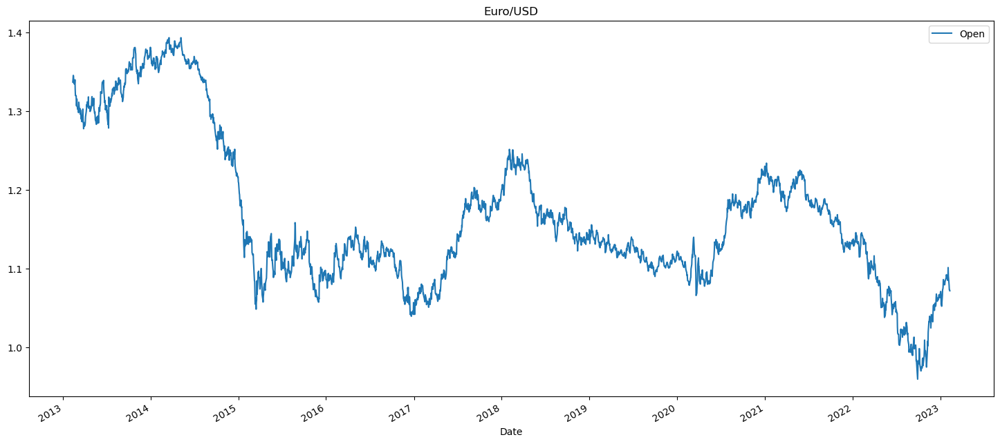

In [58]:
df.plot(figsize = (18, 8), title = "Euro/USD")

In [59]:
df.head()

,Open
Date,
2013-02-11,1.336720
2013-02-12,1.340303
2013-02-13,1.345171
2013-02-14,1.344447
2013-02-15,1.335292


In [60]:
df["returns"] = np.log(df.div(df.shift(1)))


In [61]:
df

,Open,returns
Date,,
2013-02-11,1.336720,NaN
2013-02-12,1.340303,0.002677
2013-02-13,1.345171,0.003625
2013-02-14,1.344447,-0.000538
2013-02-15,1.335292,-0.006833
...,...,...
2023-02-03,1.090513,-0.009830
2023-02-06,1.079086,-0.010533
2023-02-07,1.073076,-0.005585


In [62]:
df.dropna(inplace = True)

In [63]:
df

,Open,returns
Date,,
2013-02-12,1.340303,0.002677
2013-02-13,1.345171,0.003625
2013-02-14,1.344447,-0.000538
2013-02-15,1.335292,-0.006833
2013-02-18,1.334223,-0.000801
...,...,...
2023-02-03,1.090513,-0.009830
2023-02-06,1.079086,-0.010533
2023-02-07,1.073076,-0.005585


# Hold strategy

<AxesSubplot:>

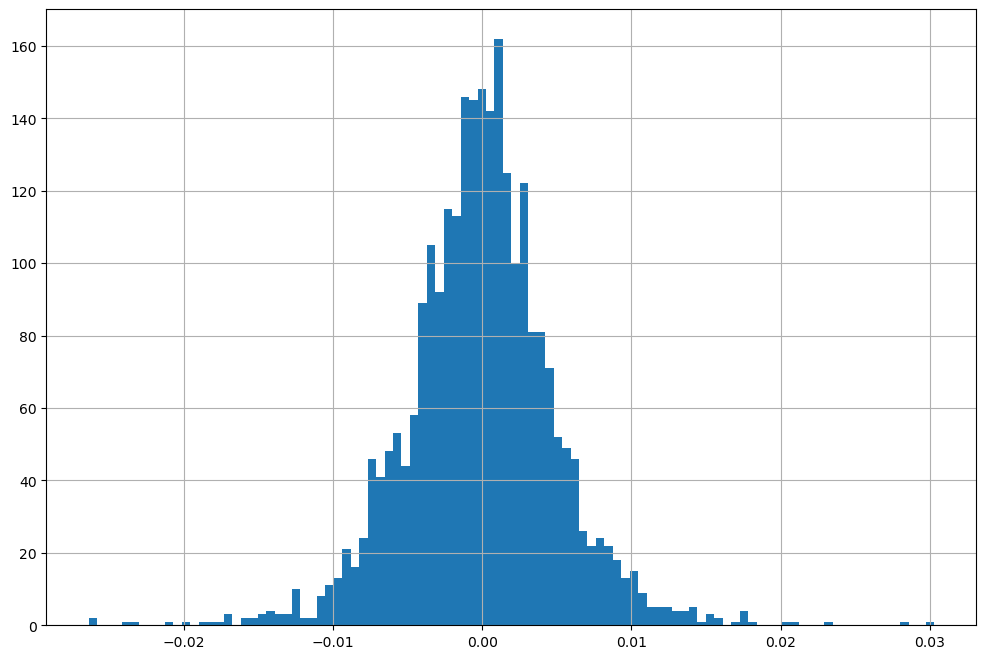

In [64]:
df.returns.hist(bins = 100, figsize = (12, 8))

In [65]:
df.returns.sum()

-0.2208686278950374

In [66]:
df.returns.cumsum()

Date
2013-02-12    0.002677
2013-02-13    0.006302
2013-02-14    0.005764
2013-02-15   -0.001069
2013-02-18   -0.001870
                ...   
2023-02-03   -0.203571
2023-02-06   -0.214104
2023-02-07   -0.219689
2023-02-08   -0.219785
2023-02-09   -0.220869
Name: returns, Length: 2604, dtype: float64

In [67]:
df["creturns"] = df.returns.cumsum().apply(np.exp)

In [68]:
df

,Open,returns,creturns
Date,,,
2013-02-12,1.340303,0.002677,1.002681
2013-02-13,1.345171,0.003625,1.006322
2013-02-14,1.344447,-0.000538,1.005781
2013-02-15,1.335292,-0.006833,0.998932
2013-02-18,1.334223,-0.000801,0.998132
...,...,...,...
2023-02-03,1.090513,-0.009830,0.815812
2023-02-06,1.079086,-0.010533,0.807264
2023-02-07,1.073076,-0.005585,0.802768


<AxesSubplot:xlabel='Date'>

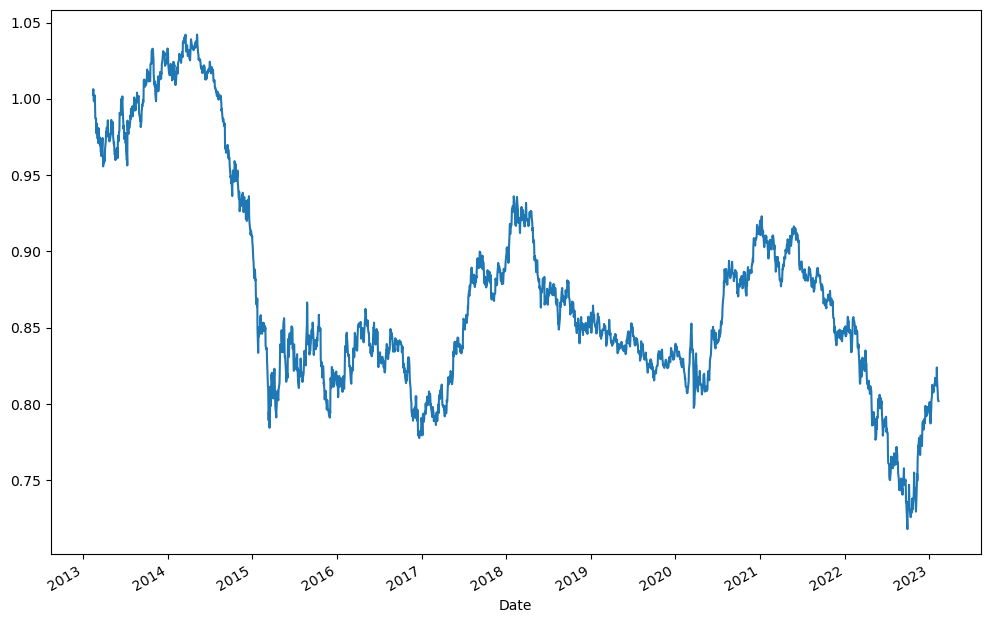

In [69]:
df.creturns.plot(figsize = (12, 8))

# Defining local max and min

In [70]:
def get_max_min(prices, smoothing, window_range):
    
    try:
        prices = prices["Close"]
        smooth_prices = prices['Close'].rolling(window=smoothing).mean().dropna()
    except KeyError:
        smooth_prices = prices.rolling(window=smoothing).mean().dropna()
    local_max = argrelextrema(smooth_prices.values, np.greater)[0]
    local_min = argrelextrema(smooth_prices.values, np.less)[0]
    price_local_max_dt = []
    for i in local_max:
        if (i>window_range) and (i<len(prices)-window_range):
            price_local_max_dt.append(prices.iloc[i-window_range:i+window_range].idxmax())
    price_local_min_dt = []
    for i in local_min:
        if (i>window_range) and (i<len(prices)-window_range):
            price_local_min_dt.append(prices.iloc[i-window_range:i+window_range].idxmin())  
    maxima = pd.DataFrame(prices.loc[price_local_max_dt])
    minima = pd.DataFrame(prices.loc[price_local_min_dt])
    max_min = pd.concat([maxima, minima]).sort_index()
    max_min.index.name = 'Date'
    max_min = max_min.reset_index()
    max_min = max_min[~max_min.Date.duplicated()]
    p = prices.reset_index()   
    max_min['day_num'] = p[p['Date'].isin(max_min.Date)].index.values
    try:
        max_min = max_min.set_index('day_num')['Close']
    except KeyError:
        max_min = max_min.set_index('day_num')

    
    return max_min

In [71]:
start = "2017-11-01"
end = "2018-9-30"
prices = yf.download(tickers = "AMZN", start = start, end = end)
smoothing = 1
window_range = 1

[*********************100%***********************]  1 of 1 completed


# Defining Min and Max points and plotting

In [72]:
minmax = get_max_min(prices, smoothing, window_range)

In [73]:
minmax

day_num
5       56.644001
7       56.267502
9       56.841999
10      56.334499
11      56.864498
          ...    
220     97.052498
221     96.320999
222     97.214996
223     95.750504
227    100.649002
Name: Close, Length: 101, dtype: float64

In [74]:
print(len(minmax))

101


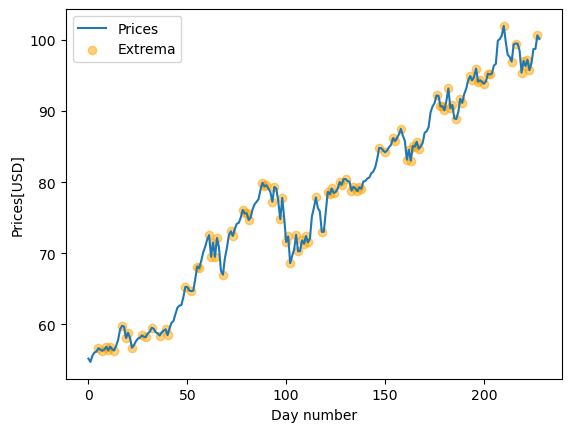

In [75]:
prices.reset_index()["Close"].plot(label="Prices")
plt.scatter(minmax.index, minmax.values, color = "orange", alpha = 0.5, label="Extrema")
plt.ylabel("Prices[USD]")
plt.xlabel("Day number")
plt.legend()

# Finding patterns

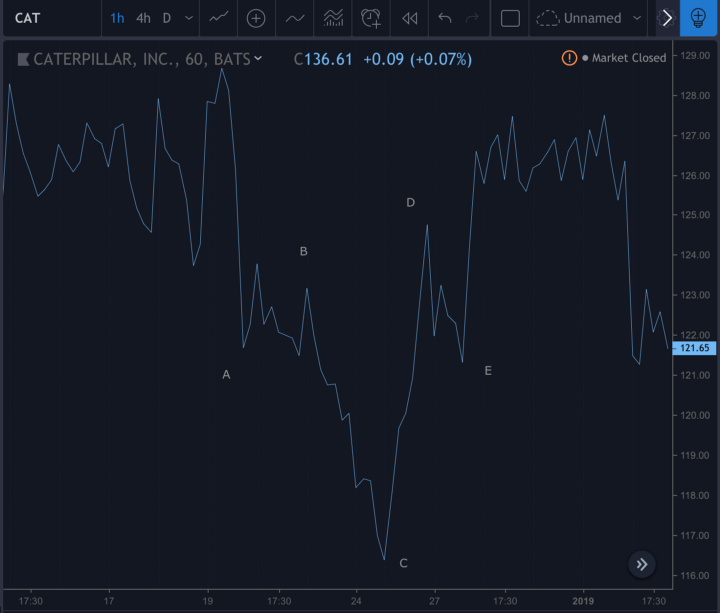

## To find patterns, we simply iterate over all our min max points, and find windows where the points meet some pattern criteria. For example, an inverse head and shoulders can roughly be defined as:

C < A, B, D, E

A, E < B, D

To filter for head and shoulders with even necklines:

abs(B-D) < np.mean([B, D])*0.05

(The difference between the necklines must not be more than 5%.)

# FUNCTION FOR INVERSE HEAD AND SHOULDERS

In [114]:
def find_patterns(max_min, bd_difference, ae_difference, stock_symbol = None):  
    patterns = defaultdict(list)
    for i in range(5, len(max_min)):  
        window = max_min.iloc[i-5:i]
        if stock_symbol:
            window = window[stock_symbol]
        a, b, c, d, e = window.iloc[0:5]          
        # IHS
        
        if a<b and c<a and c<e and c<d and e<d and abs(b-d)<=np.mean([b,d])*bd_difference and abs(a-e)<=np.mean([a,e])*ae_difference:
            patterns['IHS'].append((window.index[0], window.index[-1]))
        
    return patterns

In [115]:
patterns = find_patterns(minmax, 0.02, 0.04)
patterns

defaultdict(list,
            {'IHS': [(19, 29),
              (100, 106),
              (133, 138),
              (161, 165),
              (183, 189),
              (197, 203)]})

# Reorganize and iterate to find best params

## In order to find the best params, I reorganized my code into functions and iterated through multiple stocks, smoothing, and window parameters.

In [124]:
def plot_minmax_patterns(prices, max_min, patterns, stock, window, ema, diff):
    
    incr = str((prices.index[1] - prices.index[0]).seconds/60)
    
    if len(patterns) == 0:
        pass
    else:
        num_pat = len([x for x in patterns.items()][0][1])
        f, axes = plt.subplots(1, 2, figsize=(16, 5))
        axes = axes.flatten()
        try:
            prices_ = prices.reset_index()['Close']
        except KeyError:
            prices_ = prices.reset_index()[stock]
            max_min = max_min[stock]
        axes[0].plot(prices_)
        axes[0].scatter(max_min.index, max_min, s=100, alpha=.3, color='orange')
        axes[1].plot(prices_)
        for name, end_day_nums in patterns.items():
            for i, tup in enumerate(end_day_nums):
                sd = tup[0]
                ed = tup[1]
                axes[1].scatter(max_min.loc[sd:ed].index,
                              max_min.loc[sd:ed].values,
                              s=200, alpha=.3)
                plt.yticks([])
        plt.tight_layout()
        plt.title('{}: {}: EMA {}, Window {}, Difference {}, ({} patterns)'.format(stock, incr, ema, window, diff, num_pat))






In [117]:
plot_minmax_patterns(prices, minmax, patterns, "AMZN")

TypeError: plot_minmax_patterns() missing 3 required positional arguments: 'window', 'ema', and 'diff'

In [80]:
# def get_results(prices, max_min, pat, stock, ema_, window_):
    
#     incr = str((prices.index[1] - prices.index[0]).seconds/60)
#     prices = prices.reset_index()
#     #fw_list = [1, 12, 24, 36] 
#     fw_list = [1, 2, 3]
#     results = []
#     if len(pat.items()) > 0:
#         end_dates = [v for k, v in pat.items()][0]      
#         for date in end_dates:  
#             param_res = {'stock': stock,
#                          'increment': incr,
#                          'ema': ema_,
#                          'window': window_, 
#                          'date': date}
#             for x in fw_list:
#                 try:
#                     returns = (prices[stock].pct_change(x).shift(-x).reset_index(drop=True).dropna())
#                 except KeyError:
#                     returns = (prices['Close'].pct_change(x).shift(-x).reset_index(drop=True).dropna())
#                 try:
#                     param_res['fw_ret_{}'.format(x)] = returns.loc[date[1]]   
#                 except Exception as e:
#                     param_res['fw_ret_{}'.format(x)] = e
#             results.append(param_res)  
#     else:
#         param_res = {'stock': stock,
#                      'increment': incr,
#                      'ema': ema_,
#                      'window': window_,
#                      'date': None}
#         for x in fw_list:
#             param_res['fw_ret_{}'.format(x)] = None   
#         results.append(param_res)
#     return pd.DataFrame(results)

In [126]:
def screener(stock_data, ema_list, window_list, difference_list):
    
    all_results = pd.DataFrame()
    stock_data = stock_data["Close"]
    
    for stock in stock_data:
        prices = stock_data[stock]
        
        for ema_ in ema_list:
            for window_ in window_list:
                for differences in difference_list:
                    max_min = get_max_min(prices, smoothing=ema_, window_range=window_)
                    pat = find_patterns(max_min, differences[0], differences[1], stock)
                    plot_minmax_patterns(prices, max_min, pat, stock, window_, ema_, differences)

In [82]:
stocklist = ["MSFT", "V", "AMZN", "GOOG", "NFLX", "AAPL","PM", "TSLA", "MA"]

In [83]:
start = "2022-01-08"
end = "2023-01-8"

In [84]:
stock_data = yf.download(tickers = stocklist, start = start, end = end)

[*********************100%***********************]  9 of 9 completed


In [121]:
ema_list = [0, 1, 2, 3, 4]
window_list = [1, 5, 10, 15, 20]
difference_list = [(0.01, 0.02), (0.02, 0.04)]

C:\Users\admin\AppData\Local\Temp\ipykernel_2552\4028284239.py:9: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



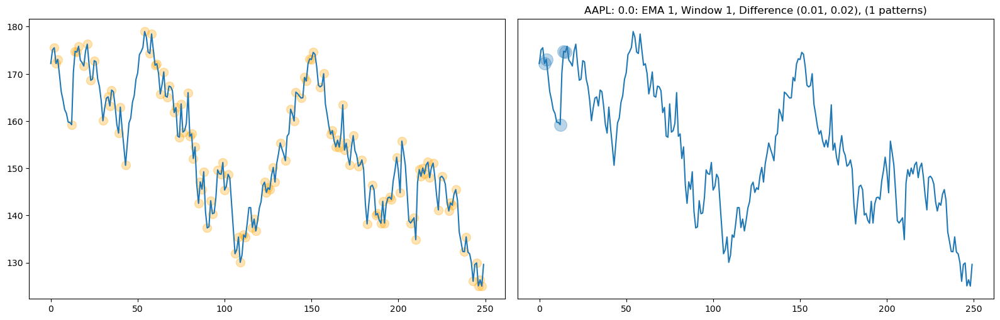

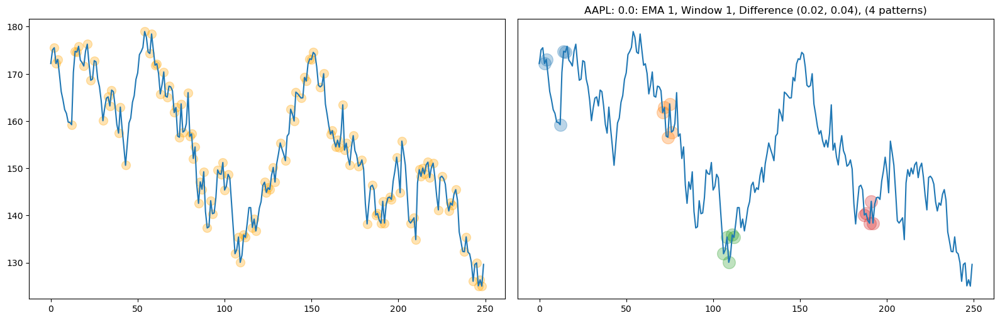

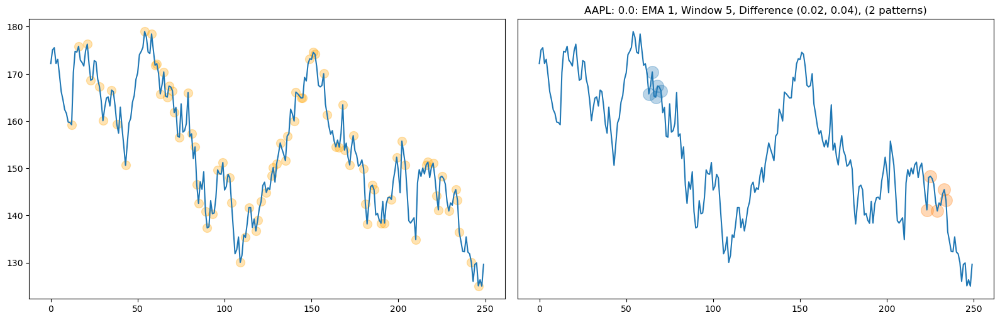

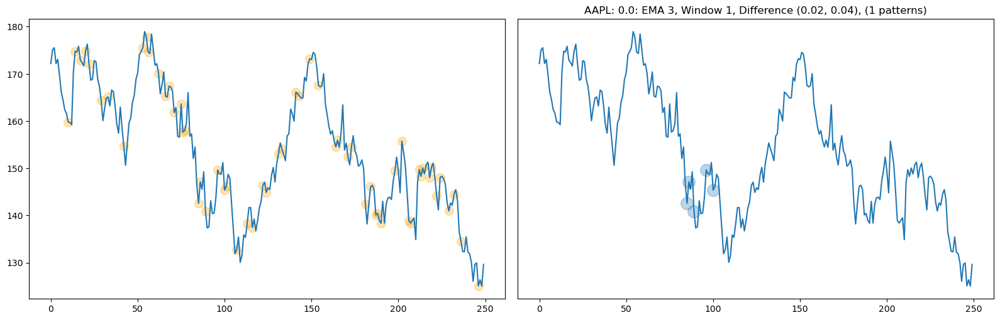

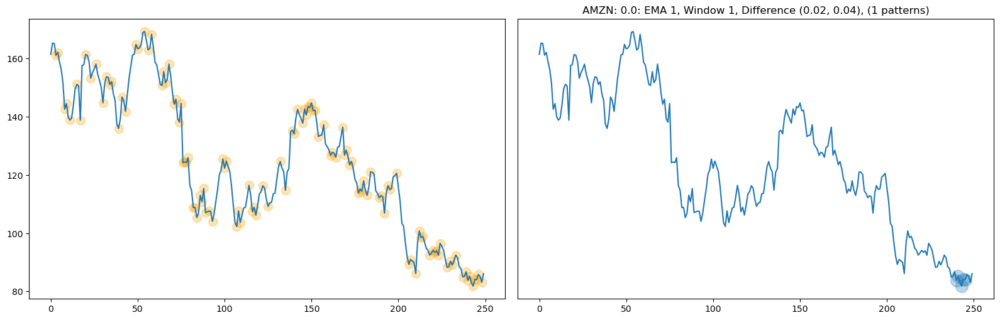

...

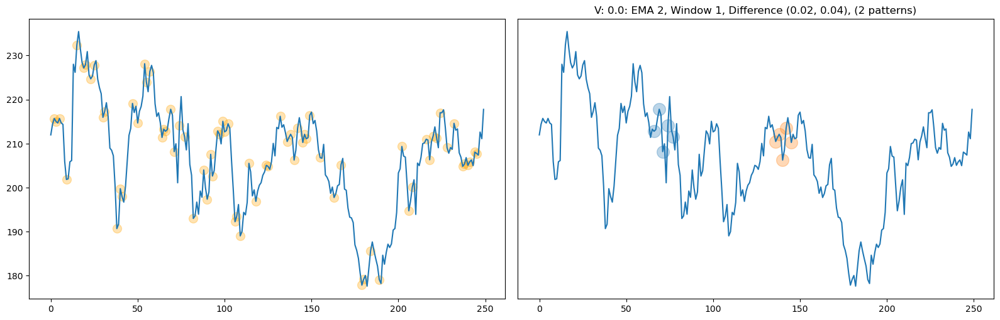

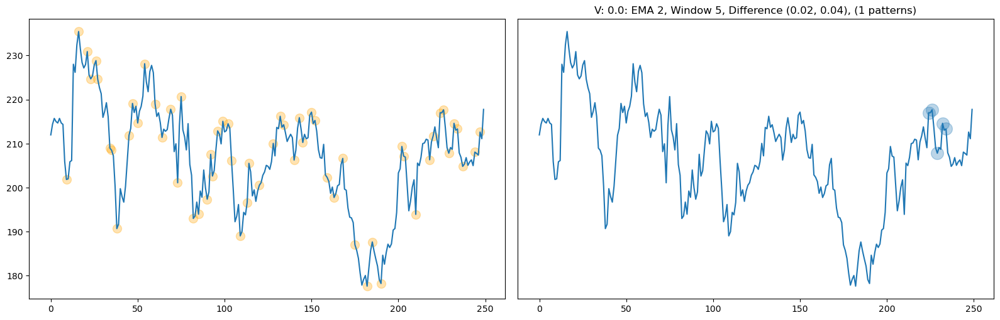

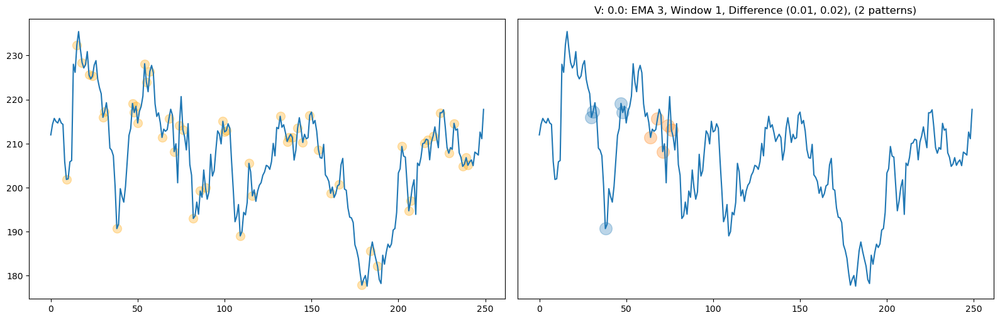

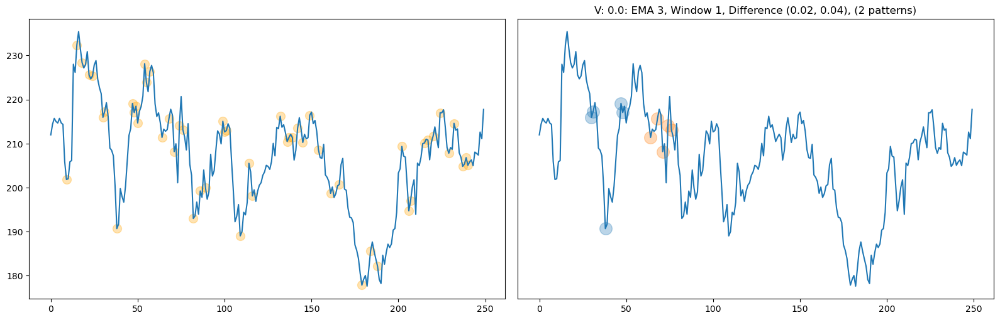

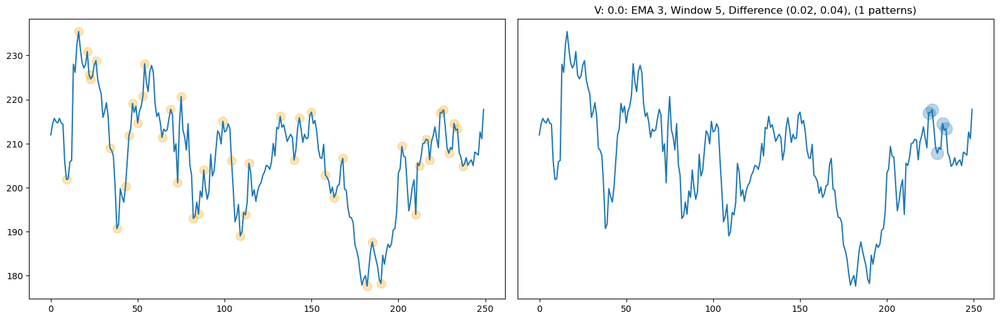

In [127]:
results = screener(stock_data, ema_list, window_list, difference_list)

# Resistance lines

In [ ]:
def find_supp_lines(max_min):    
    supp_lines = []
    # Window range is 5 units
    for i in range(5, len(max_min)):  
        window = max_min.iloc[i-5:i]
        
        # Pattern must play out in less than n units
        if window.index[-1] - window.index[0] > 100:      
            continue   
        a, b, c, d, e = window.iloc[0:5]
                
        # IHS
        if c < b  and c < d and d < e and b < a:
            supp_lines.append(c)
        
    return supp_lines

In [ ]:
def find_res_lines(max_min):
    res_lines = []
    # Window range is 5 units
    for i in range(5, len(max_min)):  
        window = max_min.iloc[i-5:i]
        
        # Pattern must play out in less than n units
        if window.index[-1] - window.index[0] > 100:      
            continue   
        a, b, c, d, e = window.iloc[0:5]
                
        # IHS
        if c > b  and c > d and d > e and b > a:
            res_lines.append(c)
        
    return res_lines

In [ ]:
prices.reset_index()["Close"].plot()
plt.scatter(minmax.index, minmax.values, color = "orange", alpha = 0.5)

In [ ]:
supp_lines = find_supp_lines(minmax)
res_lines = find_res_lines(minmax)

In [ ]:
prices["Close"].plot()
for line in supp_lines:
    plt.axhline(y = line, color = 'b', linestyle = ':', label = "blue line")
for line in res_lines:
    plt.axhline(y = line, color = 'r', linestyle = ':', label = "red line")
    
plt.legend()
